<a href="https://colab.research.google.com/github/Aoiizu/PCVK2026/blob/main/PCVK3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [23]:
import os
import glob
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from math import log10, sqrt

IMAGES_DIR = '/content/drive/MyDrive/Images'

def P(name):
    return os.path.join(IMAGES_DIR, name)

def load(name, flags=cv.IMREAD_COLOR):
    img = cv.imread(P(name), flags)
    if img is None:
        raise FileNotFoundError(P(name))
    return img

def truncate(x):
    return np.clip(x, 0, 255).astype(np.uint8)

def show(*pairs, figsize=(13, 6)):
    n = len(pairs)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]
    for ax, (title, img) in zip(axes, pairs):
        if img.ndim == 2:
            ax.imshow(img, cmap='gray', vmin=0, vmax=255)
        else:
            ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Inverse


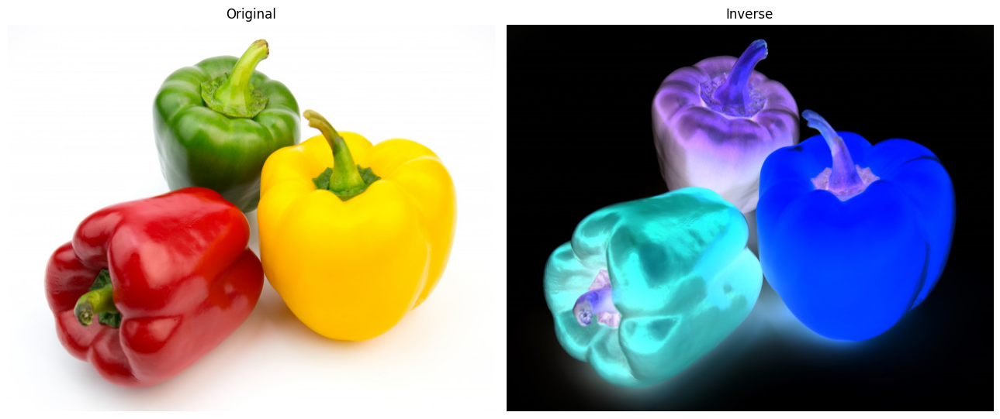

In [24]:
original = load('peppers.jpg')
inverse_image = 255 - original
show(('Original', original), ('Inverse', inverse_image))

# Contrast

 Mengubah kontras dan tingkat kecerahan citra 
------------------------------------------
Masukkan tingkat kecerahan : 200
Masukkan kontras : 20


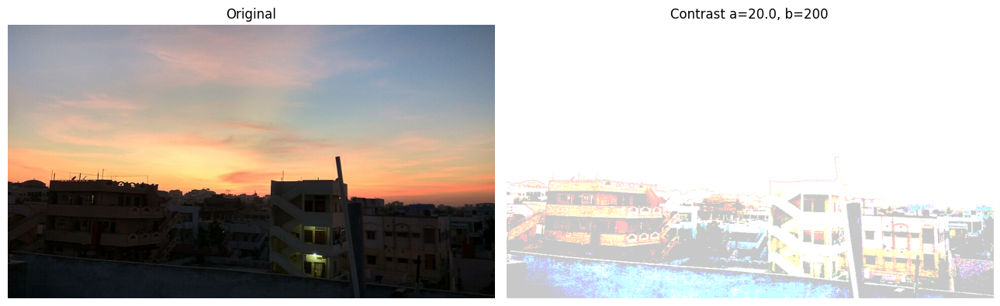

In [25]:
print(' Mengubah kontras dan tingkat kecerahan citra ')
try:
    brightness = int(input('Masukkan tingkat kecerahan : '))
    contrast   = float(input('Masukkan kontras : '))
except ValueError:
    brightness, contrast = 10, 1.5

original = load('sunset.jpg')
F = (259.0 * (contrast + 255.0)) / (255.0 * (259.0 - contrast))
r = truncate(F * (original[:,:,2].astype(np.float64) - 128) + 128)
g = truncate(F * (original[:,:,1].astype(np.float64) - 128) + 128)
b = truncate(F * (original[:,:,0].astype(np.float64) - 128) + 128)
contrast_image = cv.merge([b, g, r])
contrast_image = truncate(contrast * contrast_image.astype(np.float64) + brightness)

show(('Original', original), (f'Contrast a={contrast}, b={brightness}', contrast_image))

# Brightness

 Mengubah tingkat kecerahan citra dengan Transformasi Log 
Masukkan nilai kecerahan: 9


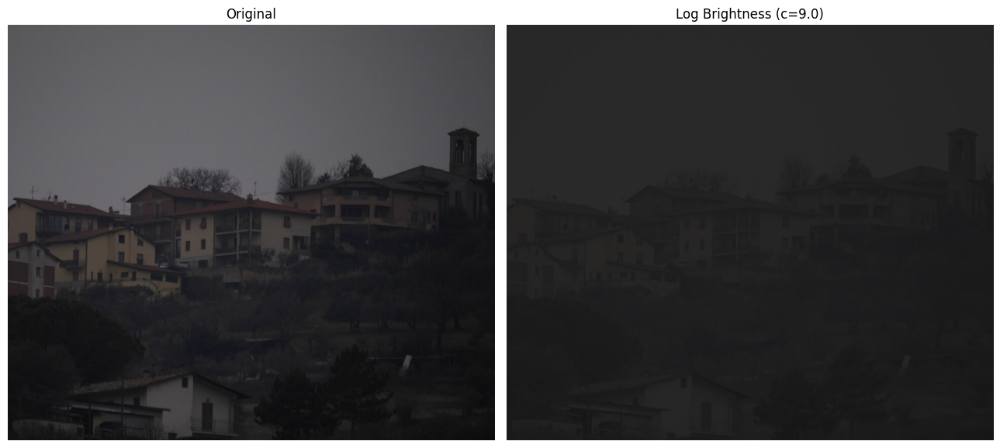

In [34]:
print(' Mengubah tingkat kecerahan citra dengan Transformasi Log ')
try:
    c = float(input('Masukkan nilai kecerahan: '))
except ValueError:
    c = 50.0

original = load('houses.jpg')
log_image = truncate(c * np.log1p(original.astype(np.float64)))
show(('Original', original), (f'Log Brightness (c={c})', log_image))

# Grayscale

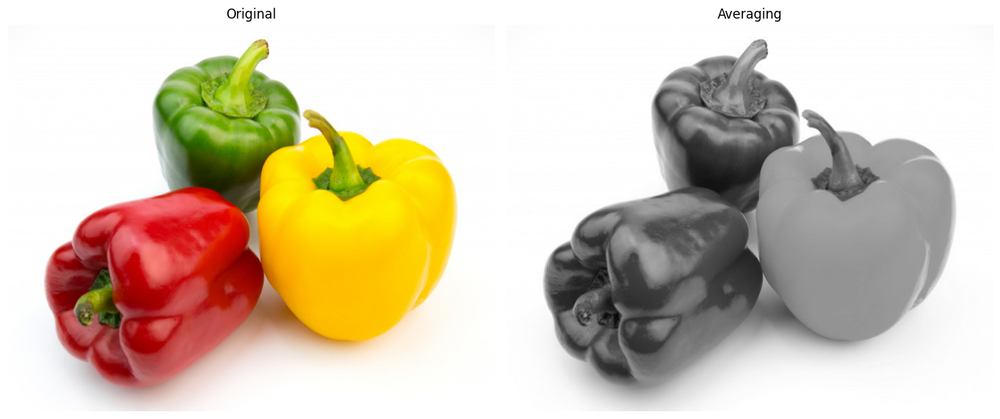

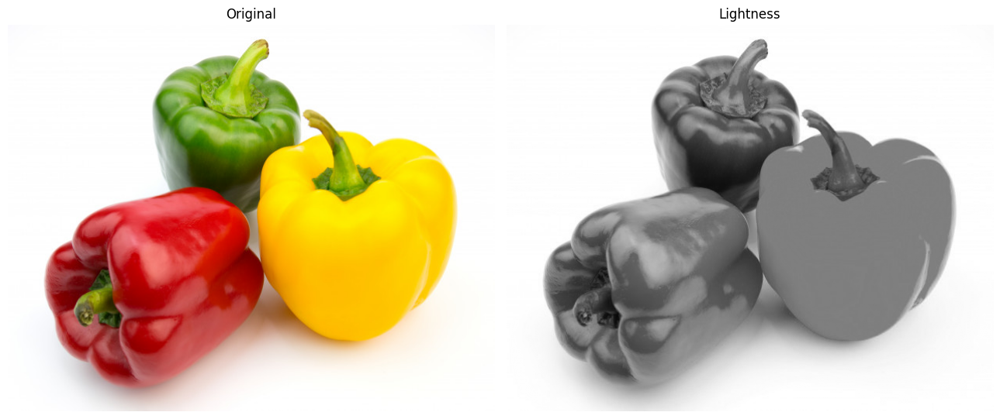

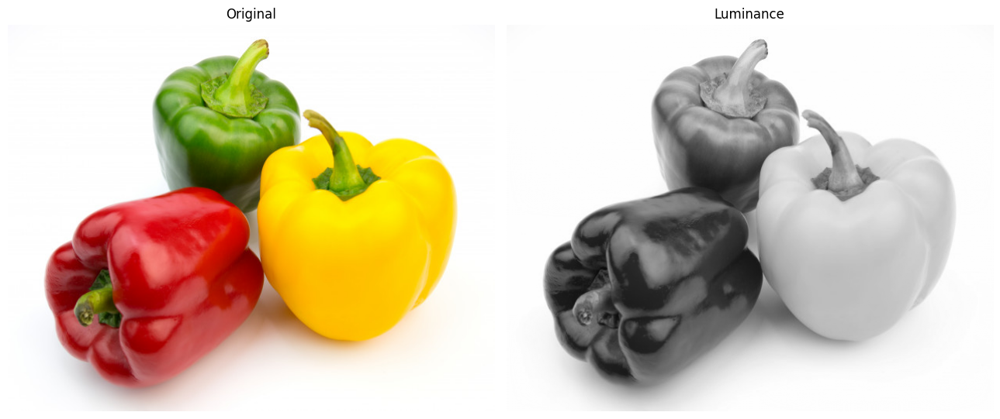

In [27]:
def gs_average(img):
    b, g, r = cv.split(img.astype(np.float64))
    return truncate((r + g + b) / 3.0)

def gs_lightness(img):
    f = img.astype(np.float64)
    return truncate((f.max(axis=2) + f.min(axis=2)) / 2.0)

def gs_luminance(img):
    b, g, r = cv.split(img.astype(np.float64))
    return truncate(0.21 * r + 0.72 * g + 0.07 * b)

original = load('peppers.jpg')
show(('Original', original), ('Averaging',  gs_average(original)))
show(('Original', original), ('Lightness',  gs_lightness(original)))
show(('Original', original), ('Luminance',  gs_luminance(original)))

# Color Isolation

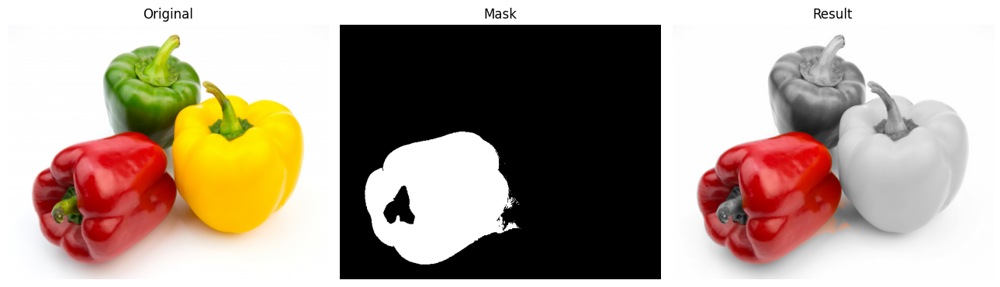

In [28]:
original = load('peppers.jpg')
hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

mask = cv.bitwise_or(
    cv.inRange(hsv, np.array([0,   70, 50]), np.array([10,  255, 255])),
    cv.inRange(hsv, np.array([170, 70, 50]), np.array([180, 255, 255]))
)

gray3  = cv.cvtColor(gs_luminance(original), cv.COLOR_GRAY2BGR)
result = np.where(cv.cvtColor(mask, cv.COLOR_GRAY2BGR) > 0, original, gray3)
show(('Original', original), ('Mask', mask), ('Result', result))

# Gamma Correction

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 200


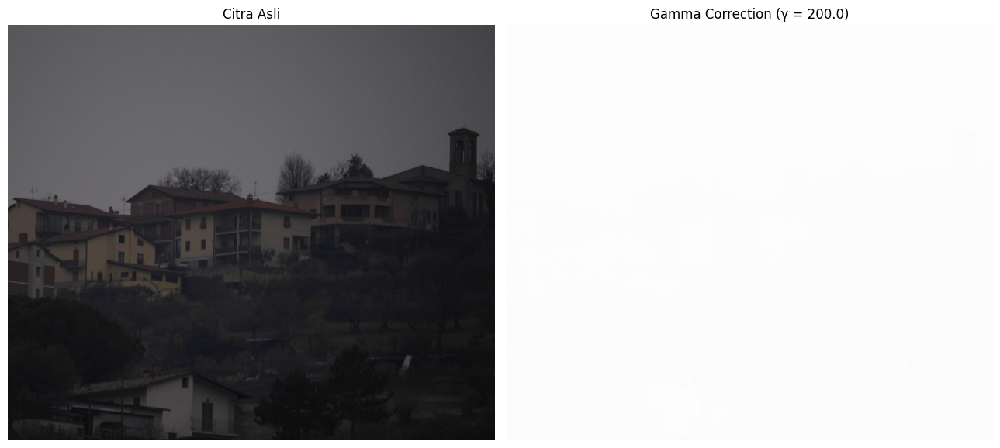

In [29]:
print(' Gamma Correction pada citra ')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    gamma = 0.5

def gamma_correction(img, gamma):
    lut = np.array([255.0 * ((i / 255.0) ** (1.0 / gamma)) for i in range(256)])
    return cv.LUT(img, truncate(lut))

original = load('houses.jpg')
show(('Citra Asli', original), (f'Gamma Correction (γ = {gamma})', gamma_correction(original, gamma)))

# Depth

Masukkan bit depth tujuan (1-8): 1
Bit depth awal  : 8 bit
Bit depth tujuan: 1 bit
Jumlah level    : 2


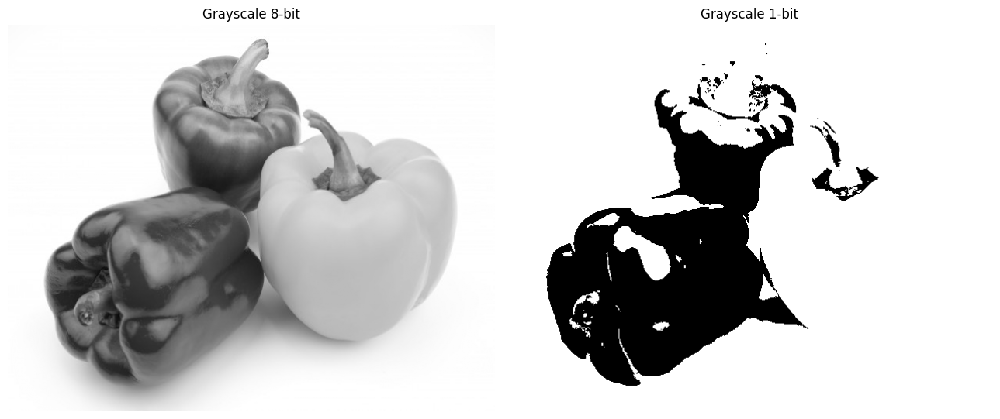

In [30]:
def image_depth(img, bit_depth):
    level = 255.0 / (pow(2, bit_depth) - 1)
    return truncate(np.round(img.astype(np.float64) / level) * level)

try:
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))
except ValueError:
    bit_depth = 3

original = load('peppers.jpg', cv.IMREAD_GRAYSCALE)
print('Bit depth awal  : 8 bit')
print(f'Bit depth tujuan: {bit_depth} bit')
print(f'Jumlah level    : {pow(2, bit_depth)}')
show(('Grayscale 8-bit', original), (f'Grayscale {bit_depth}-bit', image_depth(original, bit_depth)))

# Denoising

Noisy images loaded: 100

No   Jumlah Citra      Nilai PSNR (dB)
----------------------------------------
1    10                19.74
2    20                19.84
3    40                19.89
4    80                19.92
5    100               19.92


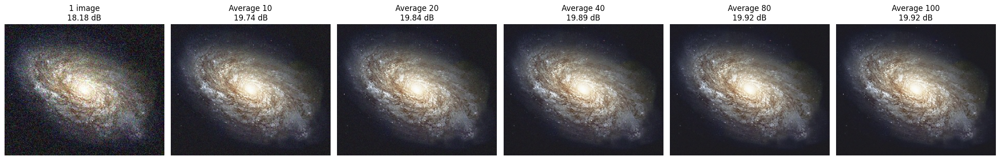

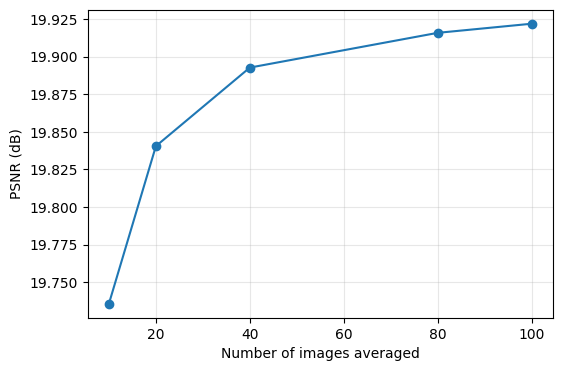

In [31]:
def PSNR(img1, img2):
    mse = np.mean((img1.astype(np.float64) - img2.astype(np.float64)) ** 2)
    if mse == 0:
        return 100
    return 20 * log10(255.0 / sqrt(mse))

def average_denoise(images, k):
    acc = np.zeros(images[0].shape, dtype=np.float64)
    for im in images[:k]:
        acc += im.astype(np.float64)
    return truncate(acc / k)

galaxy = load('galaxy.jpg')

cv_img = []
for img_path in sorted(glob.glob(os.path.join(IMAGES_DIR, 'noises', '*.jpg'))):
    n = cv.imread(img_path)
    if n is not None:
        cv_img.append(n)

print('Noisy images loaded:', len(cv_img))

counts  = [10, 20, 40, 80, 100]
results = {}
psnrs   = []

for k in counts:
    den = average_denoise(cv_img, k)
    results[k] = den
    psnrs.append(PSNR(galaxy, den))

print(f'\n{"No":<5}{"Jumlah Citra":<18}{"Nilai PSNR (dB)"}')
print('-' * 40)
for i, (k, p) in enumerate(zip(counts, psnrs), 1):
    print(f'{i:<5}{k:<18}{p:.2f}')

fig, axes = plt.subplots(1, len(counts) + 1, figsize=(22, 4))
axes[0].imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
axes[0].set_title(f'1 image\n{PSNR(galaxy, cv_img[0]):.2f} dB')
axes[0].axis('off')
for ax, k, p in zip(axes[1:], counts, psnrs):
    ax.imshow(cv.cvtColor(results[k], cv.COLOR_BGR2RGB))
    ax.set_title(f'Average {k}\n{p:.2f} dB')
    ax.axis('off')
plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(counts, psnrs, 'o-')
plt.xlabel('Number of images averaged')
plt.ylabel('PSNR (dB)')
plt.grid(alpha=.3)
plt.show()

# Image Masking

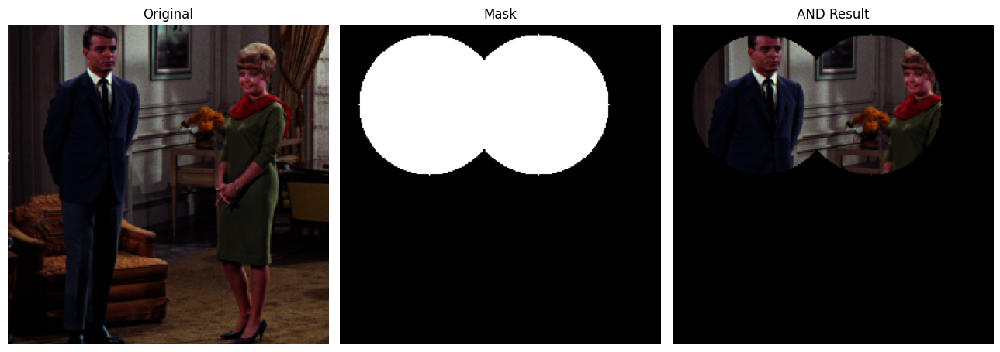

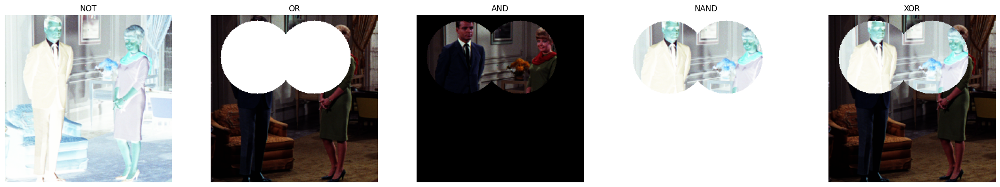

In [32]:
couple = load('couple.tiff')
h, w   = couple.shape[:2]

mask = np.zeros((h, w), dtype=np.uint8)
r    = int(min(h, w) * 0.22)
cv.circle(mask, (int(w * 0.28), int(h * 0.25)), r, 255, -1)
cv.circle(mask, (int(w * 0.62), int(h * 0.25)), r, 255, -1)
mask_bgr = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)

ops = {
    'NOT':  cv.bitwise_not(couple),
    'OR':   cv.bitwise_or(couple,  mask_bgr),
    'AND':  cv.bitwise_and(couple, mask_bgr),
    'NAND': cv.bitwise_not(cv.bitwise_and(couple, mask_bgr)),
    'XOR':  cv.bitwise_xor(couple, mask_bgr),
}

show(('Original', couple), ('Mask', mask), ('AND Result', ops['AND']))

fig, axes = plt.subplots(1, 5, figsize=(22, 4))
for ax, (name, out) in zip(axes, ops.items()):
    ax.imshow(cv.cvtColor(out, cv.COLOR_BGR2RGB))
    ax.set_title(name)
    ax.axis('off')
plt.tight_layout()
plt.show()

# Night Photo

Saving Screenshot 2025-11-21 173059.png to Screenshot 2025-11-21 173059.png


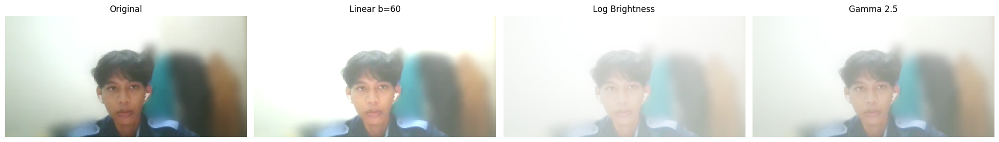

In [16]:
from google.colab import files
uploaded   = files.upload()
night_path = list(uploaded.keys())[0]
night      = cv.imread(night_path)

linear    = truncate(night.astype(np.int16) + 60)
log_img   = truncate(255 / np.log(256) * np.log1p(night.astype(np.float64)))
gamma_img = gamma_correction(night, 2.5)

show(('Original',        night),
     ('Linear b=60',     linear),
     ('Log Brightness',  log_img),
     ('Gamma 2.5',       gamma_img),
     figsize=(20, 5))

# Crayfish

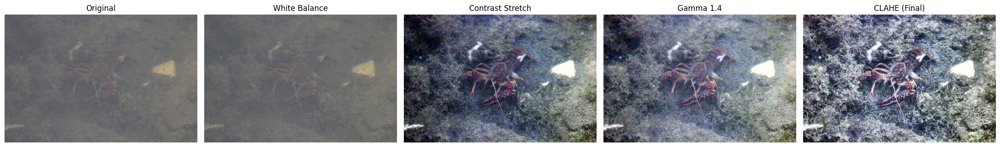

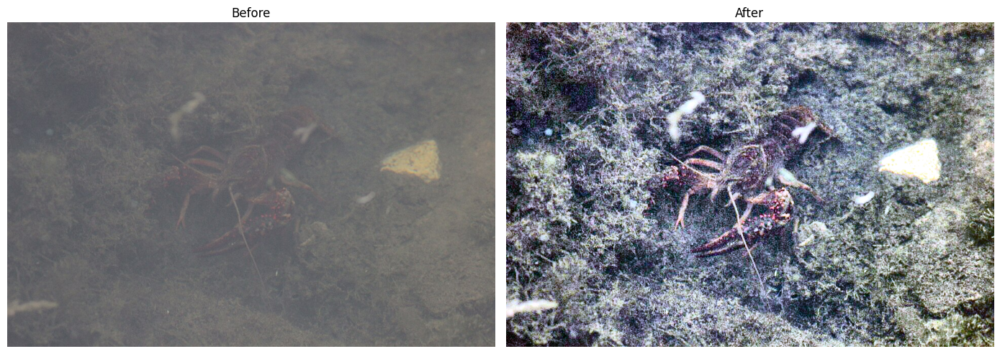

In [33]:
crayfish = load('crayfish.jpg')

def gray_world(img):
    f     = img.astype(np.float64)
    means = f.reshape(-1, 3).mean(axis=0)
    return truncate(f * (means.mean() / means))

def stretch(img, lo=1, hi=99):
    out = np.zeros_like(img, dtype=np.float64)
    for c in range(3):
        ch       = img[:, :, c].astype(np.float64)
        a, b_    = np.percentile(ch, lo), np.percentile(ch, hi)
        out[:,:,c] = (ch - a) * 255.0 / max(b_ - a, 1e-6)
    return truncate(out)

def clahe_L(img, clip=2.5, grid=8):
    lab      = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    L, A, B  = cv.split(lab)
    L        = cv.createCLAHE(clipLimit=clip, tileGridSize=(grid, grid)).apply(L)
    return cv.cvtColor(cv.merge([L, A, B]), cv.COLOR_LAB2BGR)

step1 = gray_world(crayfish)
step2 = stretch(step1, 1, 99)
step3 = gamma_correction(step2, 1.4)
final = clahe_L(step3)

show(('Original',         crayfish),
     ('White Balance',    step1),
     ('Contrast Stretch', step2),
     ('Gamma 1.4',        step3),
     ('CLAHE (Final)',    final),
     figsize=(22, 5))

show(('Before', crayfish), ('After', final), figsize=(14, 7))